<a href="https://colab.research.google.com/github/gangakailas/DeepLearning/blob/main/Set_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

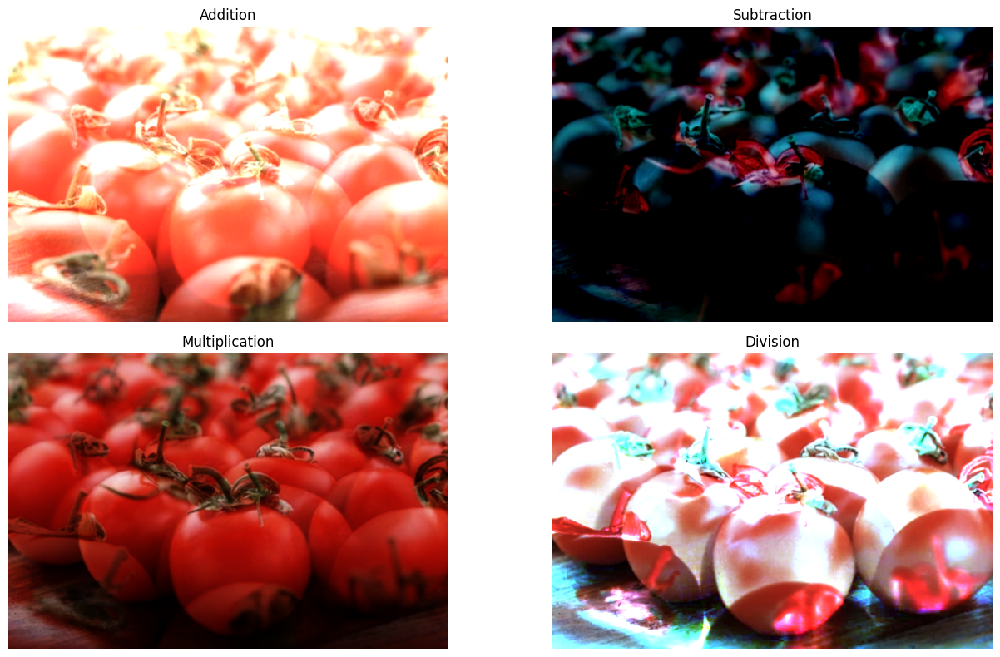

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load two new images from Google Drive
image1_path = '/content/drive/MyDrive/img1.png'  # ✅ update path
image2_path = '/content/drive/MyDrive/img2.png'  # ✅ update path

img1 = Image.open(image1_path).convert('RGB')
img2 = Image.open(image2_path).convert('RGB')

# Resize both to the same size (use img1 size)
img2 = img2.resize(img1.size)

# Convert to NumPy arrays
img1_np = np.array(img1).astype(np.float32)
img2_np = np.array(img2).astype(np.float32)

# Perform arithmetic operations
added = np.clip(img1_np + img2_np, 0, 255).astype(np.uint8)
subtracted = np.clip(img1_np - img2_np, 0, 255).astype(np.uint8)
multiplied = np.clip((img1_np * img2_np) / 255, 0, 255).astype(np.uint8)
divided = np.clip((img1_np / (img2_np + 1e-5)) * 255, 0, 255).astype(np.uint8)

# Plot all results
titles = ['Addition', 'Subtraction', 'Multiplication', 'Division']
images = [added, subtracted, multiplied, divided]

plt.figure(figsize=(14, 8))
for i in range(4):
    plt.subplot(2, 2, i+1)
    plt.imshow(images[i])
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()


Averaging Level  | MSE        | PSNR (dB) 
---------------------------------------------
2                | 287.90     | 23.54     
8                | 74.21      | 29.43     
16               | 38.36      | 32.29     
32               | 20.45      | 35.02     
128              | 7.15       | 39.59     


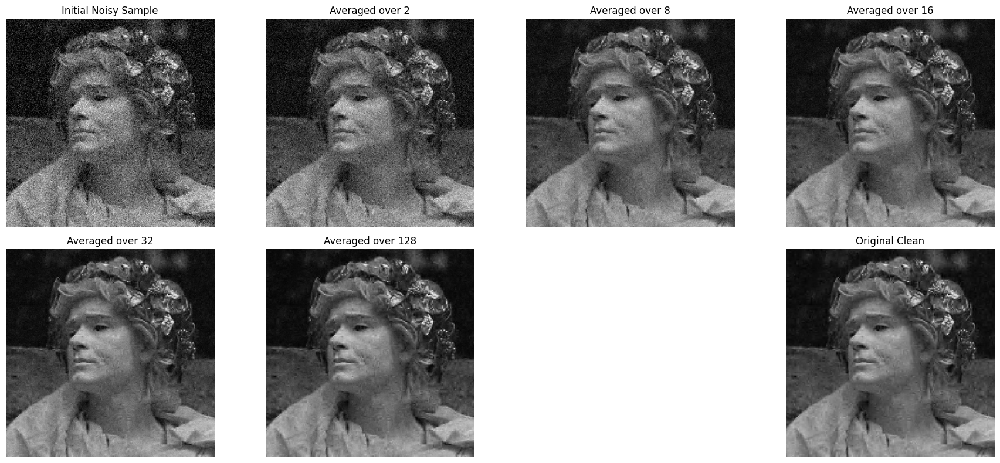

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


noisy_img = cv2.imread('/content/drive/MyDrive/noisy_img.jpg')  # Replace with your image path
noisy_img = cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB)
clean_img = cv2.imread('/content/drive/MyDrive/clean_img.jpg', cv2.IMREAD_GRAYSCALE)

# Parameters
num_versions_list = [2, 8, 16, 32, 128]
noise_std = 25  # Gaussian noise std deviation

# Metrics
def compute_mse(img1, img2):
    return np.mean((img1.astype(np.float32) - img2.astype(np.float32)) ** 2)

def compute_psnr(img1, img2):
    mse = compute_mse(img1, img2)
    if mse == 0:
        return float('inf')
    PIXEL_MAX = 255.0
    return 20 * np.log10(PIXEL_MAX / np.sqrt(mse))

# Generate noisy images
results = {}
denoised_images = {}
sample_noisy = None  # To store the first noisy image

for n in num_versions_list:
    noisy_imgs = []
    for i in range(n):
        noise = np.random.normal(0, noise_std, clean_img.shape)
        noisy = clean_img.astype(np.float32) + noise
        noisy = np.clip(noisy, 0, 255).astype(np.uint8)
        noisy_imgs.append(noisy)
        if n == num_versions_list[0] and i == 0:  # Store the very first noisy image
            sample_noisy = noisy.copy()

    avg_img = np.mean(np.stack(noisy_imgs), axis=0).astype(np.uint8)
    denoised_images[n] = avg_img

    mse = compute_mse(clean_img, avg_img)
    psnr = compute_psnr(clean_img, avg_img)
    results[n] = (mse, psnr)

# Print results
print(f"{'Averaging Level':<16} | {'MSE':<10} | {'PSNR (dB)':<10}")
print("-" * 45)
for n in num_versions_list:
    mse, psnr = results[n]
    print(f"{n:<16} | {mse:<10.2f} | {psnr:<10.2f}")

# Plot images
plt.figure(figsize=(18, 8))
plt.subplot(2, 4, 1)
plt.imshow(sample_noisy, cmap='gray')
plt.title("Initial Noisy Sample")
plt.axis('off')

for idx, n in enumerate(num_versions_list):
    plt.subplot(2, 4, idx + 2)
    plt.imshow(denoised_images[n], cmap='gray')
    plt.title(f"Averaged over {n}")
    plt.axis('off')

plt.subplot(2, 4, 8)
plt.imshow(clean_img, cmap='gray')
plt.title("Original Clean")
plt.axis('off')

plt.tight_layout()
plt.show()


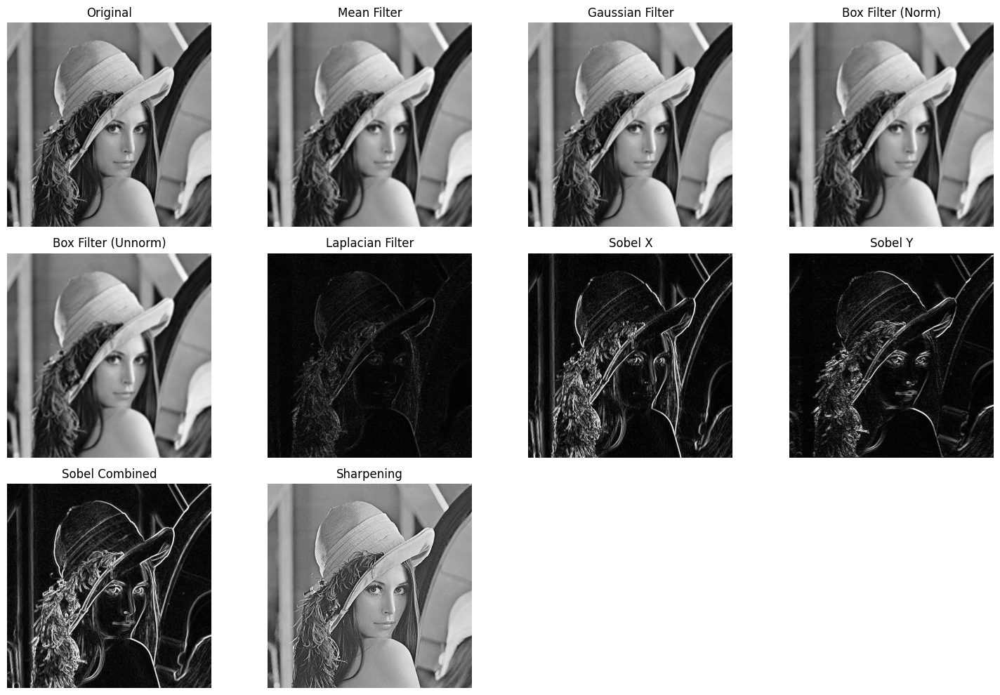

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image (grayscale for spatial filtering)
image = cv2.imread('/content/drive/MyDrive/lena.png', cv2.IMREAD_GRAYSCALE)

# 1. Mean (Averaging) Filter
mean_filtered = cv2.blur(image, (5, 5))  # kernel size 5x5

# 2. Gaussian Filter
gaussian_filtered = cv2.GaussianBlur(image, (5, 5), 1)  # sigma=1

# 3. Box Filter (Unnormalized and Normalized)
box_normalized = cv2.boxFilter(image, -1, (5, 5), normalize=True)
# Convert to float32 to prevent overflow
image_float = image.astype(np.float32)

# Unnormalized box filter (sums values without dividing)
box_unnormalized_float = cv2.boxFilter(image_float, -1, (5, 5), normalize=False)

# Normalize for display
box_unnormalized_disp = cv2.normalize(box_unnormalized_float, None, 0, 255, cv2.NORM_MINMAX)
box_unnormalized_disp = box_unnormalized_disp.astype(np.uint8)



# 4. Laplacian Filter (Edge detection)
laplacian_filtered = cv2.Laplacian(image, cv2.CV_64F)
laplacian_filtered = cv2.convertScaleAbs(laplacian_filtered)  # convert back to uint8

# 5. Sobel Filter
sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)  # X-direction
sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)  # Y-direction
sobel_combined = cv2.magnitude(sobel_x, sobel_y)
sobel_combined = cv2.convertScaleAbs(sobel_combined)

# 6. Sharpening Filter (Custom kernel)
sharpen_kernel = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])
sharpened = cv2.filter2D(image, -1, sharpen_kernel)

# ---- Plotting all results ----
plt.figure(figsize=(15, 10))

plt.subplot(3, 4, 1)
plt.imshow(image, cmap='gray')
plt.title("Original")
plt.axis('off')

plt.subplot(3, 4, 2)
plt.imshow(mean_filtered, cmap='gray')
plt.title("Mean Filter")
plt.axis('off')

plt.subplot(3, 4, 3)
plt.imshow(gaussian_filtered, cmap='gray')
plt.title("Gaussian Filter")
plt.axis('off')

plt.subplot(3, 4, 4)
plt.imshow(box_normalized, cmap='gray')
plt.title("Box Filter (Norm)")
plt.axis('off')

plt.subplot(3, 4, 5)
plt.imshow(box_unnormalized_disp, cmap='gray')
plt.title("Box Filter (Unnorm)")
plt.axis('off')


plt.subplot(3, 4, 6)
plt.imshow(laplacian_filtered, cmap='gray')
plt.title("Laplacian Filter")
plt.axis('off')

plt.subplot(3, 4, 7)
plt.imshow(cv2.convertScaleAbs(sobel_x), cmap='gray')
plt.title("Sobel X")
plt.axis('off')

plt.subplot(3, 4, 8)
plt.imshow(cv2.convertScaleAbs(sobel_y), cmap='gray')
plt.title("Sobel Y")
plt.axis('off')

plt.subplot(3, 4, 9)
plt.imshow(sobel_combined, cmap='gray')
plt.title("Sobel Combined")
plt.axis('off')

plt.subplot(3, 4, 10)
plt.imshow(sharpened, cmap='gray')
plt.title("Sharpening")
plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
def save_averaging_kernel(size, path):
    if size % 2 == 0:
        raise ValueError("Kernel size must be an odd number.")

    value = round(1 / (size * size), 5)
    row = ' '.join([str(value)] * size)
    kernel_text = '\n'.join([row] * size)

    with open(path, 'w') as f:
        f.write(kernel_text)

    print(f"✅ {size}x{size} averaging kernel saved to {path}")


# Example usages:
save_averaging_kernel(3, '/content/kernel_3x3.txt')
save_averaging_kernel(7, '/content/kernel_7x7.txt')
save_averaging_kernel(11, '/content/kernel_11x11.txt')


✅ 3x3 averaging kernel saved to /content/kernel_3x3.txt
✅ 7x7 averaging kernel saved to /content/kernel_7x7.txt
✅ 11x11 averaging kernel saved to /content/kernel_11x11.txt


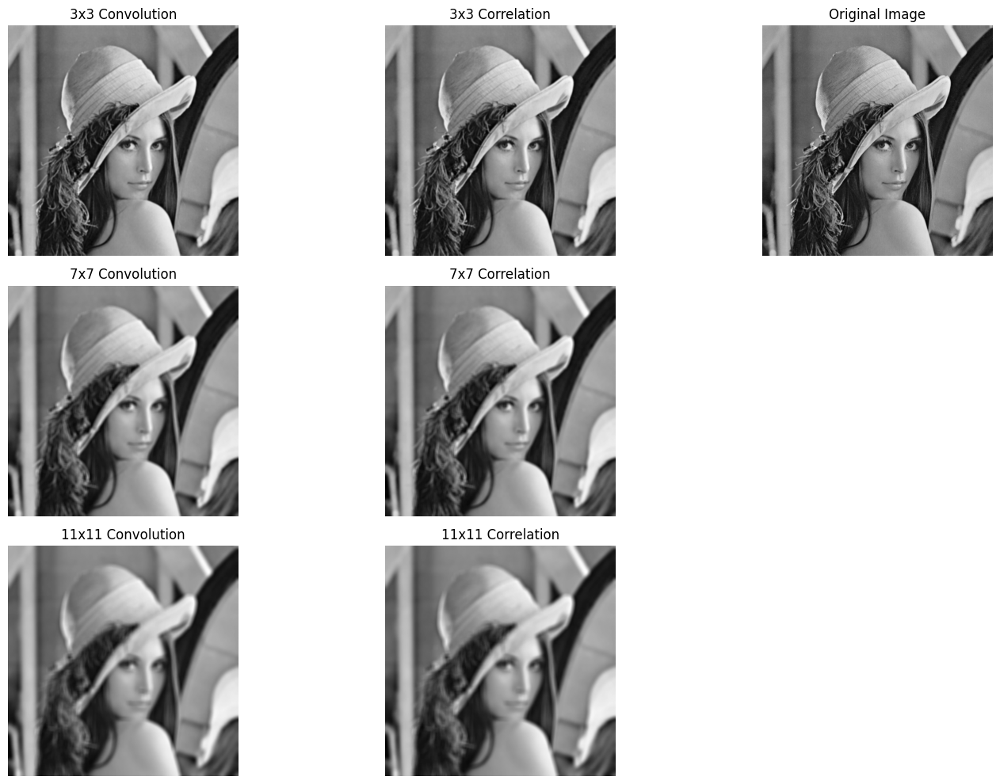

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def load_kernel_from_file(filepath):
    with open(filepath, 'r') as f:
        lines = f.readlines()
        kernel = [list(map(float, line.strip().split())) for line in lines]
    return np.array(kernel)

def apply_convolution(image, kernel):
    return cv2.filter2D(image, -1, kernel)

def apply_correlation(image, kernel):
    flipped_kernel = cv2.flip(kernel, -1)  # Flip both axes for correlation
    return cv2.filter2D(image, -1, flipped_kernel)

# Load image (grayscale)
image = cv2.imread('/content/drive/MyDrive/lena.png', cv2.IMREAD_GRAYSCALE)

# Load different kernels
kernel_3x3 = load_kernel_from_file('/content/kernel_3x3.txt')
kernel_7x7 = load_kernel_from_file('/content/kernel_7x7.txt')
kernel_11x11 = load_kernel_from_file('/content/kernel_11x11.txt')

# Apply convolution and correlation
def process(image, kernel):
    conv = apply_convolution(image, kernel)
    corr = apply_correlation(image, kernel)
    return conv, corr

conv3, corr3 = process(image, kernel_3x3)
conv7, corr7 = process(image, kernel_7x7)
conv11, corr11 = process(image, kernel_11x11)

# Display results
plt.figure(figsize=(15, 10))

plt.subplot(3, 3, 1)
plt.imshow(conv3, cmap='gray')
plt.title('3x3 Convolution')
plt.axis('off')

plt.subplot(3, 3, 2)
plt.imshow(corr3, cmap='gray')
plt.title('3x3 Correlation')
plt.axis('off')

plt.subplot(3, 3, 4)
plt.imshow(conv7, cmap='gray')
plt.title('7x7 Convolution')
plt.axis('off')

plt.subplot(3, 3, 5)
plt.imshow(corr7, cmap='gray')
plt.title('7x7 Correlation')
plt.axis('off')

plt.subplot(3, 3, 7)
plt.imshow(conv11, cmap='gray')
plt.title('11x11 Convolution')
plt.axis('off')

plt.subplot(3, 3, 8)
plt.imshow(corr11, cmap='gray')
plt.title('11x11 Correlation')
plt.axis('off')

plt.subplot(3, 3, 3)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.tight_layout()
plt.show()


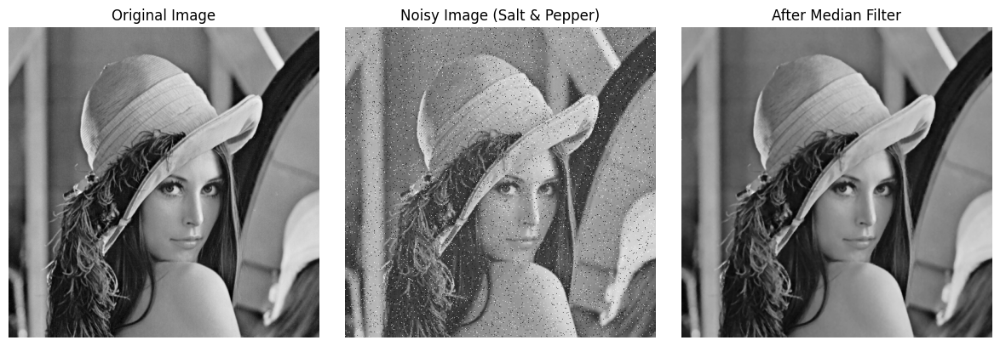

In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the image from Google Drive (grayscale)
image = cv2.imread('/content/drive/MyDrive/lena.png', cv2.IMREAD_GRAYSCALE)
if image is None:
    raise ValueError("⚠️ Image not found. Check the file path.")

# Function to add salt & pepper noise
def add_salt_pepper_noise(image, salt_prob=0.02, pepper_prob=0.02):
    noisy = np.copy(image)
    total_pixels = image.shape[0] * image.shape[1]

    # Salt noise
    num_salt = int(total_pixels * salt_prob)
    coords = [np.random.randint(0, i - 1, num_salt) for i in image.shape]
    noisy[coords[0], coords[1]] = 255

    # Pepper noise
    num_pepper = int(total_pixels * pepper_prob)
    coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape]
    noisy[coords[0], coords[1]] = 0

    return noisy

# Add salt & pepper noise
noisy_img = add_salt_pepper_noise(image, 0.02, 0.02)

# Apply median filter
filtered_img = cv2.medianBlur(noisy_img, 3)

# Display the results
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Noisy Image (Salt & Pepper)")
plt.imshow(noisy_img, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("After Median Filter")
plt.imshow(filtered_img, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


Method     | Edge Density | Mean Gradient   | Entropy   
------------------------------------------------------------
Sobel      | 0.9952       | 41.27           | 6.53      
Prewitt    | 0.6934       | 17.05           | 4.89      
Roberts    | 0.7350       | 5.83            | 3.93      
LoG        | 0.8223       | 2.98            | 3.12      
Canny      | 0.0540       | 13.78           | 0.30      


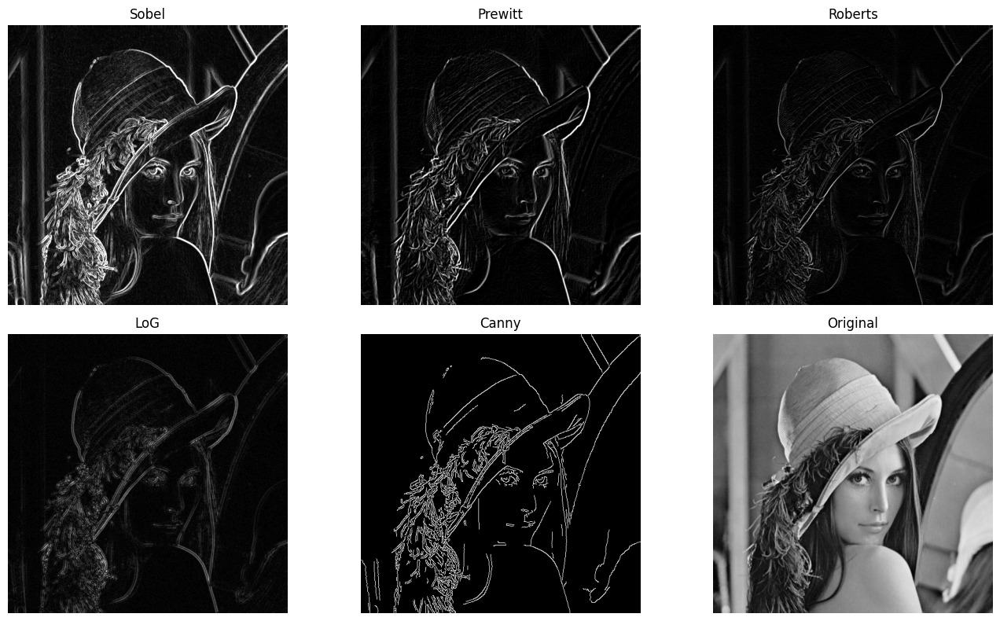

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import shannon_entropy

# --- Assuming `image` already loaded as grayscale ---

# Sobel
sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
sobel = cv2.magnitude(sobel_x, sobel_y)
sobel = cv2.convertScaleAbs(sobel)

# Prewitt
prewitt_kernel_x = np.array([[1, 0, -1],
                             [1, 0, -1],
                             [1, 0, -1]], dtype=np.float32)
prewitt_kernel_y = np.array([[1, 1, 1],
                             [0, 0, 0],
                             [-1, -1, -1]], dtype=np.float32)
prewitt_x = cv2.filter2D(image, -1, prewitt_kernel_x)
prewitt_y = cv2.filter2D(image, -1, prewitt_kernel_y)
prewitt = cv2.magnitude(prewitt_x.astype(float), prewitt_y.astype(float))
prewitt = cv2.convertScaleAbs(prewitt)

# Roberts
roberts_cross_x = np.array([[1, 0],
                            [0, -1]], dtype=np.float32)
roberts_cross_y = np.array([[0, 1],
                            [-1, 0]], dtype=np.float32)
roberts_x = cv2.filter2D(image, -1, roberts_cross_x)
roberts_y = cv2.filter2D(image, -1, roberts_cross_y)
roberts = cv2.magnitude(roberts_x.astype(float), roberts_y.astype(float))
roberts = cv2.convertScaleAbs(roberts)

# Laplacian of Gaussian
blurred = cv2.GaussianBlur(image, (5, 5), 0)
log = cv2.Laplacian(blurred, cv2.CV_64F)
log = cv2.convertScaleAbs(log)

# Canny
canny = cv2.Canny(image, 100, 200)

# ---------------- METRIC FUNCTIONS ----------------
def edge_metrics(edge_img):
    """Compute edge density, mean gradient, and entropy."""
    edge_binary = (edge_img > 0).astype(np.uint8)
    edge_density = np.mean(edge_binary)
    mean_grad = np.mean(edge_img)
    entropy_val = shannon_entropy(edge_img)
    return edge_density, mean_grad, entropy_val

# Compute metrics for all methods
methods = {
    "Sobel": sobel,
    "Prewitt": prewitt,
    "Roberts": roberts,
    "LoG": log,
    "Canny": canny
}

print(f"{'Method':<10} | {'Edge Density':<12} | {'Mean Gradient':<15} | {'Entropy':<10}")
print("-" * 60)
for name, img in methods.items():
    d, g, e = edge_metrics(img)
    print(f"{name:<10} | {d:<12.4f} | {g:<15.2f} | {e:<10.2f}")

# ---------------- DISPLAY RESULTS ----------------
plt.figure(figsize=(14, 8))
for i, (name, img) in enumerate(methods.items(), 1):
    plt.subplot(2, 3, i)
    plt.imshow(img, cmap='gray')
    plt.title(name)
    plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(image, cmap='gray')
plt.title("Original")
plt.axis('off')

plt.tight_layout()
plt.show()


In [2]:
import cv2

# Load the color image
image_bgr = cv2.imread('/content/drive/MyDrive/peppers.jpg')

# Convert BGR to RGB
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

print("✅ Image successfully converted to RGB and stored in 'image_rgb'")


✅ Image successfully converted to RGB and stored in 'image_rgb'


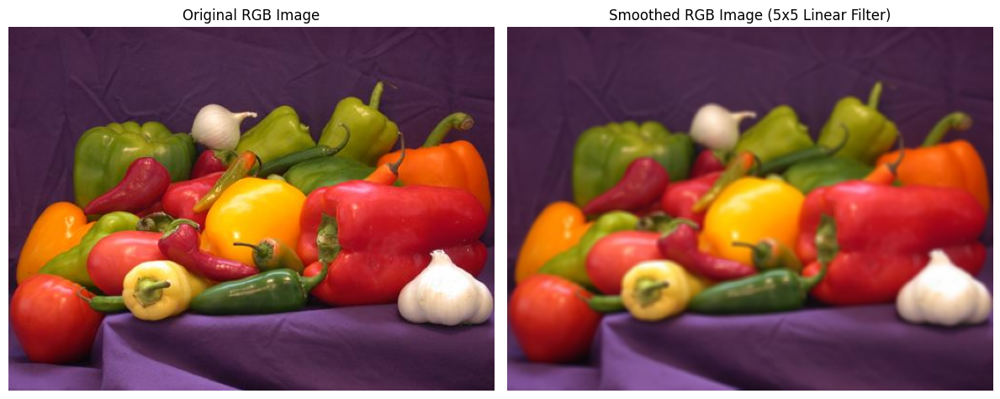

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Assuming `image_rgb` is already loaded

# Define kernel size for smoothing
kernel_size = (5, 5)  # 5x5 averaging filter

# Apply linear smoothing (averaging) to the RGB image
smoothed_rgb = cv2.blur(image_rgb, kernel_size)

# Display original and smoothed images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original RGB Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(smoothed_rgb)
plt.title(f"Smoothed RGB Image ({kernel_size[0]}x{kernel_size[1]} Linear Filter)")
plt.axis('off')

plt.tight_layout()
plt.show()


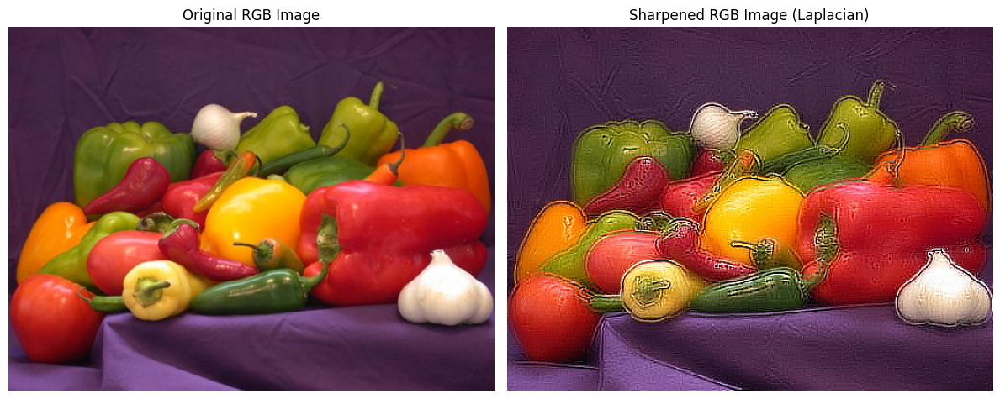

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Assuming `image_rgb` is already loaded

# Convert image to float32 for precision
image_float = image_rgb.astype(np.float32)

# Apply Laplacian filter to each channel
laplacian_kernel = cv2.Laplacian(image_float, cv2.CV_32F, ksize=3)

# Sharpen the image: original + Laplacian
sharpened_rgb = cv2.add(image_float, laplacian_kernel)

# Clip values to valid range [0, 255] and convert to uint8
sharpened_rgb = np.clip(sharpened_rgb, 0, 255).astype(np.uint8)

# Display results
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original RGB Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sharpened_rgb)
plt.title("Sharpened RGB Image (Laplacian)")
plt.axis('off')

plt.tight_layout()
plt.show()


Original image resized to: (256, 256)
Comparison Metrics:
Method               MSE        PSNR (dB) 
---------------------------------------------
No Padding           534.92     20.85     
With Padding         534.92     20.85     


Text(0.5, 1.0, 'Resized Original')

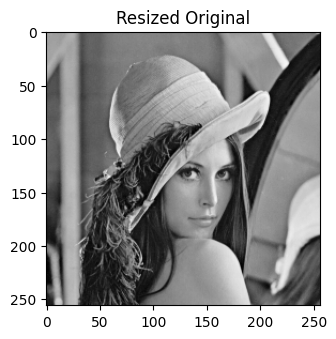

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ------------------ Resize Image to 256x256 ------------------
image_resized = cv2.resize(image, (256, 256))
print(f"Original image resized to: {image_resized.shape}")

# ------------------ Function: DFT Filtering ------------------
def dft_filtering(img, pad=False, radius=30):
    """
    Perform DFT, apply low-pass filter, and inverse DFT.
    pad: if True, zero-pad the image to optimal size
    """
    if pad:
        rows, cols = img.shape
        nrows = cv2.getOptimalDFTSize(rows)
        ncols = cv2.getOptimalDFTSize(cols)
        padded = np.zeros((nrows, ncols), dtype=np.float32)
        padded[:rows, :cols] = img.astype(np.float32)
    else:
        padded = img.astype(np.float32)

    # DFT
    dft = cv2.dft(padded, flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    # Low-pass circular mask
    rows, cols = padded.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols, 2), np.float32)
    cv2.circle(mask, (ccol, crow), radius, (1, 1), -1)

    # Apply mask
    fshift = dft_shift * mask

    # Inverse DFT
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

    if pad:
        img_back = img_back[:img.shape[0], :img.shape[1]]

    img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX)
    return img_back.astype(np.uint8)

# ------------------ Metrics ------------------
def compute_mse(img1, img2):
    return np.mean((img1.astype(np.float32) - img2.astype(np.float32)) ** 2)

def compute_psnr(img1, img2):
    mse = compute_mse(img1, img2)
    if mse == 0:
        return float('inf')
    PIXEL_MAX = 255.0
    return 20 * np.log10(PIXEL_MAX / np.sqrt(mse))

# ------------------ Apply DFT Filtering ------------------
filtered_no_pad = dft_filtering(image_resized, pad=False)
filtered_pad = dft_filtering(image_resized, pad=True)

# ------------------ Compute Metrics ------------------
mse_no_pad = compute_mse(image_resized, filtered_no_pad)
psnr_no_pad = compute_psnr(image_resized, filtered_no_pad)

mse_pad = compute_mse(image_resized, filtered_pad)
psnr_pad = compute_psnr(image_resized, filtered_pad)

print("Comparison Metrics:")
print(f"{'Method':<20} {'MSE':<10} {'PSNR (dB)':<10}")
print("-" * 45)
print(f"{'No Padding':<20} {mse_no_pad:<10.2f} {psnr_no_pad:<10.2f}")
print(f"{'With Padding':<20} {mse_pad:<10.2f} {psnr_pad:<10.2f}")

# ------------------ Display ------------------
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(image_resized, cmap='gray')
plt.title("Resized Original")


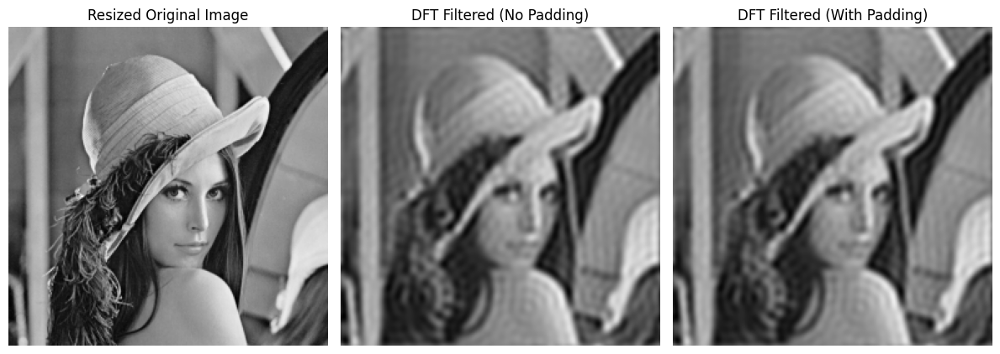

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ------------------ Function: DFT Filtering ------------------
def dft_filtering(img, pad=False):
    """
    Perform DFT, apply low-pass filter, and inverse DFT.
    pad: if True, zero-pad the image to optimal size
    """
    if pad:
        # Optimal size for DFT
        rows, cols = img.shape
        nrows = cv2.getOptimalDFTSize(rows)
        ncols = cv2.getOptimalDFTSize(cols)
        padded = np.zeros((nrows, ncols), dtype=np.float32)
        padded[:rows, :cols] = img.astype(np.float32)
    else:
        padded = img.astype(np.float32)

    # Perform DFT
    dft = cv2.dft(padded, flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    # Create low-pass circular mask
    rows, cols = padded.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols, 2), np.float32)
    radius = 30  # low-pass radius
    cv2.circle(mask, (ccol, crow), radius, (1, 1), -1)

    # Apply mask
    fshift = dft_shift * mask

    # Inverse DFT
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

    # Crop to original size if padded
    if pad:
        img_back = img_back[:img.shape[0], :img.shape[1]]

    # Normalize for display
    img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX)
    img_back = img_back.astype(np.uint8)
    return img_back

# ------------------ Apply DFT Filtering ------------------
filtered_no_pad = dft_filtering(image_resized, pad=False)
filtered_pad = dft_filtering(image_resized, pad=True)

# ------------------ Display Results ------------------
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(image_resized, cmap='gray')
plt.title("Resized Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(filtered_no_pad, cmap='gray')
plt.title("DFT Filtered (No Padding)")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(filtered_pad, cmap='gray')
plt.title("DFT Filtered (With Padding)")
plt.axis('off')

plt.tight_layout()
plt.show()


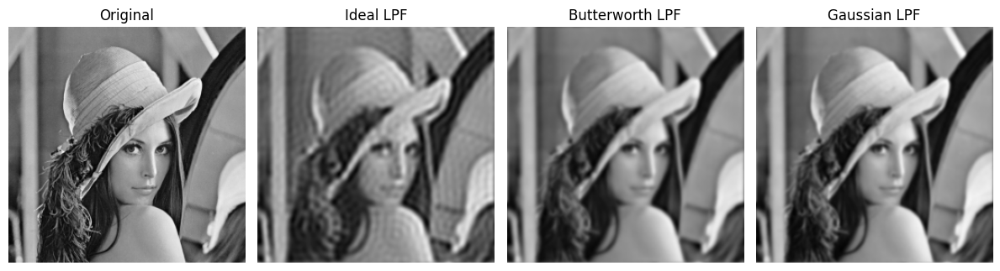

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Assume 'image_resized' is your input grayscale image of size 256x256
img = image_resized.astype(np.float32)

# Function to create frequency domain low-pass masks
def ideal_low_pass(shape, D0):
    rows, cols = shape
    crow, ccol = rows//2, cols//2
    mask = np.zeros((rows, cols), np.float32)
    for i in range(rows):
        for j in range(cols):
            D = np.sqrt((i-crow)**2 + (j-ccol)**2)
            if D <= D0:
                mask[i,j] = 1
    return mask

def butterworth_low_pass(shape, D0, n):
    rows, cols = shape
    crow, ccol = rows//2, cols//2
    mask = np.zeros((rows, cols), np.float32)
    for i in range(rows):
        for j in range(cols):
            D = np.sqrt((i-crow)**2 + (j-ccol)**2)
            mask[i,j] = 1 / (1 + (D/D0)**(2*n))
    return mask

def gaussian_low_pass(shape, D0):
    rows, cols = shape
    crow, ccol = rows//2, cols//2
    mask = np.zeros((rows, cols), np.float32)
    for i in range(rows):
        for j in range(cols):
            D = np.sqrt((i-crow)**2 + (j-ccol)**2)
            mask[i,j] = np.exp(-(D**2)/(2*(D0**2)))
    return mask

# Perform DFT
dft = cv2.dft(img, flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

# Filter parameters
D0 = 30       # cutoff frequency
n = 2         # order for Butterworth

# Generate masks
ideal_mask = ideal_low_pass(img.shape, D0)
butter_mask = butterworth_low_pass(img.shape, D0, n)
gaussian_mask = gaussian_low_pass(img.shape, D0)

# Apply masks (expand to 2 channels for complex multiplication)
def apply_mask(dft_shift, mask):
    mask_2ch = np.zeros_like(dft_shift)
    mask_2ch[:,:,0] = mask
    mask_2ch[:,:,1] = mask
    return dft_shift * mask_2ch

ideal_filtered = apply_mask(dft_shift, ideal_mask)
butter_filtered = apply_mask(dft_shift, butter_mask)
gaussian_filtered = apply_mask(dft_shift, gaussian_mask)

# Inverse DFT
def idft(filtered):
    f_ishift = np.fft.ifftshift(filtered)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:,:,0], img_back[:,:,1])
    img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX)
    return img_back.astype(np.uint8)

ideal_img = idft(ideal_filtered)
butter_img = idft(butter_filtered)
gaussian_img = idft(gaussian_filtered)

# Plot results
plt.figure(figsize=(12,6))
plt.subplot(1,4,1)
plt.imshow(img, cmap='gray')
plt.title("Original")
plt.axis('off')

plt.subplot(1,4,2)
plt.imshow(ideal_img, cmap='gray')
plt.title("Ideal LPF")
plt.axis('off')

plt.subplot(1,4,3)
plt.imshow(butter_img, cmap='gray')
plt.title("Butterworth LPF")
plt.axis('off')

plt.subplot(1,4,4)
plt.imshow(gaussian_img, cmap='gray')
plt.title("Gaussian LPF")
plt.axis('off')

plt.tight_layout()
plt.show()


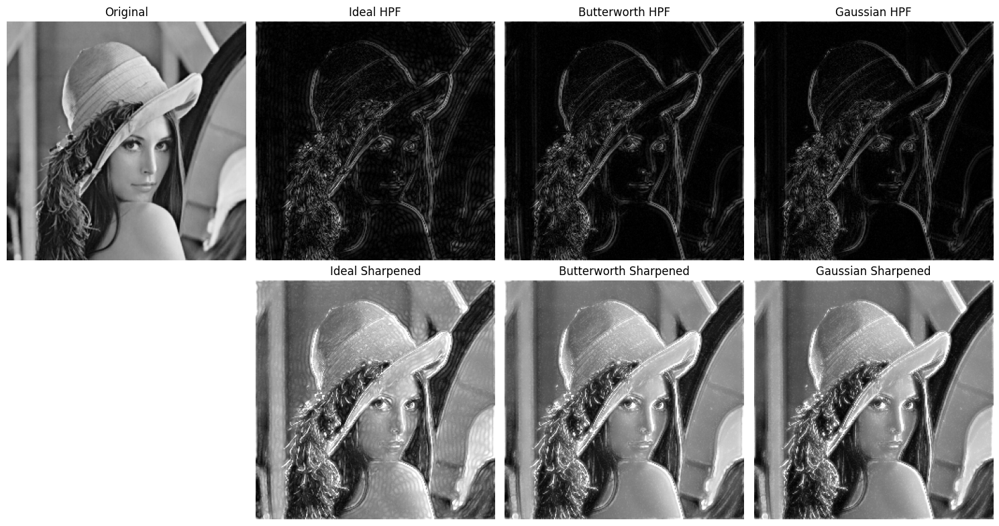

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Assume 'image_resized' is your input grayscale image
img = image_resized.astype(np.float32)

# ------------------ High-pass masks ------------------
def ideal_high_pass(shape, D0):
    rows, cols = shape
    crow, ccol = rows//2, cols//2
    mask = np.ones((rows, cols), np.float32)
    for i in range(rows):
        for j in range(cols):
            D = np.sqrt((i-crow)**2 + (j-ccol)**2)
            if D <= D0:
                mask[i,j] = 0
    return mask

def butterworth_high_pass(shape, D0, n):
    rows, cols = shape
    crow, ccol = rows//2, cols//2
    mask = np.zeros((rows, cols), np.float32)
    for i in range(rows):
        for j in range(cols):
            D = np.sqrt((i-crow)**2 + (j-ccol)**2)
            if D == 0:
                mask[i,j] = 0  # avoid divide by zero
            else:
                mask[i,j] = 1 / (1 + (D0/D)**(2*n))
    return mask

def gaussian_high_pass(shape, D0):
    rows, cols = shape
    crow, ccol = rows//2, cols//2
    mask = np.zeros((rows, cols), np.float32)
    for i in range(rows):
        for j in range(cols):
            D = np.sqrt((i-crow)**2 + (j-ccol)**2)
            mask[i,j] = 1 - np.exp(-(D**2)/(2*(D0**2)))
    return mask

# ------------------ Apply DFT ------------------
dft = cv2.dft(img, flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

# Filter parameters
D0 = 30       # cutoff frequency
n = 2         # order for Butterworth

# Generate masks
ideal_mask = ideal_high_pass(img.shape, D0)
butter_mask = butterworth_high_pass(img.shape, D0, n)
gaussian_mask = gaussian_high_pass(img.shape, D0)

# Apply masks (expand to 2 channels for complex multiplication)
def apply_mask(dft_shift, mask):
    mask_2ch = np.zeros_like(dft_shift)
    mask_2ch[:,:,0] = mask
    mask_2ch[:,:,1] = mask
    return dft_shift * mask_2ch

ideal_filtered = apply_mask(dft_shift, ideal_mask)
butter_filtered = apply_mask(dft_shift, butter_mask)
gaussian_filtered = apply_mask(dft_shift, gaussian_mask)

# ------------------ Inverse DFT ------------------
def idft(filtered):
    f_ishift = np.fft.ifftshift(filtered)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:,:,0], img_back[:,:,1])
    # Normalize for display
    img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX)
    return img_back.astype(np.uint8)

# Get high-pass images
ideal_img = idft(ideal_filtered)
butter_img = idft(butter_filtered)
gaussian_img = idft(gaussian_filtered)

# ------------------ Optional: sharpened images (unsharp masking) ------------------
def sharpen(original, highpass):
    sharpened = original + highpass  # add high-pass component
    sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)
    return sharpened

ideal_sharp = sharpen(img, ideal_img)
butter_sharp = sharpen(img, butter_img)
gaussian_sharp = sharpen(img, gaussian_img)

# ------------------ Plot results ------------------
plt.figure(figsize=(15,8))

plt.subplot(2,4,1)
plt.imshow(img, cmap='gray')
plt.title("Original")
plt.axis('off')

plt.subplot(2,4,2)
plt.imshow(ideal_img, cmap='gray')
plt.title("Ideal HPF")
plt.axis('off')

plt.subplot(2,4,3)
plt.imshow(butter_img, cmap='gray')
plt.title("Butterworth HPF")
plt.axis('off')

plt.subplot(2,4,4)
plt.imshow(gaussian_img, cmap='gray')
plt.title("Gaussian HPF")
plt.axis('off')

plt.subplot(2,4,6)
plt.imshow(ideal_sharp, cmap='gray')
plt.title("Ideal Sharpened")
plt.axis('off')

plt.subplot(2,4,7)
plt.imshow(butter_sharp, cmap='gray')
plt.title("Butterworth Sharpened")
plt.axis('off')

plt.subplot(2,4,8)
plt.imshow(gaussian_sharp, cmap='gray')
plt.title("Gaussian Sharpened")
plt.axis('off')

plt.tight_layout()
plt.show()


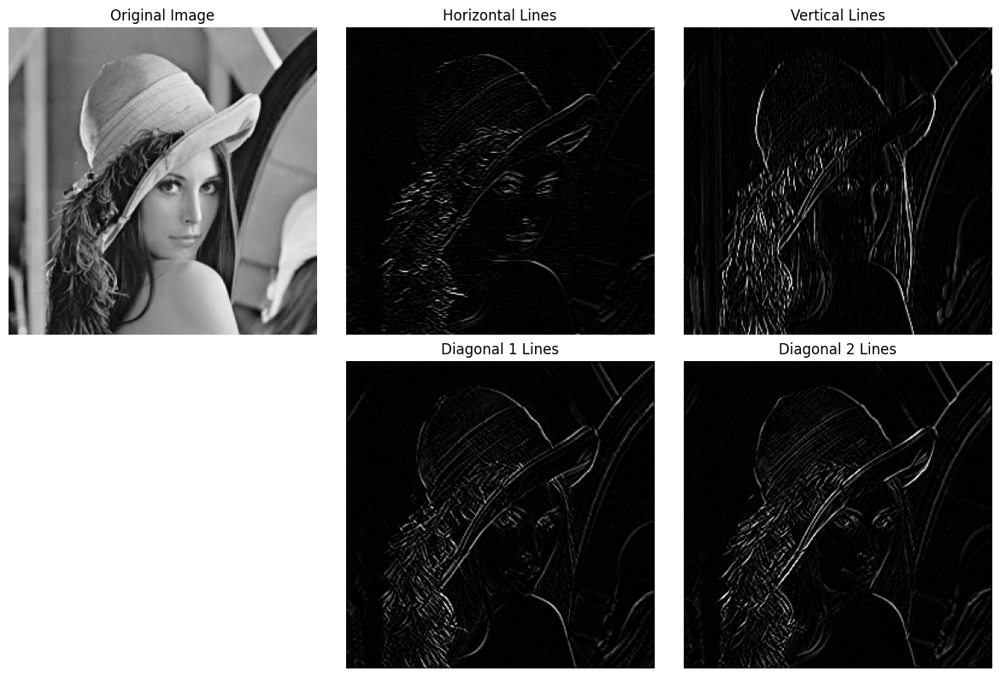

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ------------------ Define line detection masks ------------------
# Horizontal, vertical, and two diagonal directions
horizontal_mask = np.array([[-1, -1, -1],
                            [ 2,  2,  2],
                            [-1, -1, -1]], dtype=np.float32)

vertical_mask = np.array([[-1,  2, -1],
                          [-1,  2, -1],
                          [-1,  2, -1]], dtype=np.float32)

diag1_mask = np.array([[ 2, -1, -1],
                       [-1,  2, -1],
                       [-1, -1,  2]], dtype=np.float32)

diag2_mask = np.array([[-1, -1,  2],
                       [-1,  2, -1],
                       [ 2, -1, -1]], dtype=np.float32)

# ------------------ Apply convolution ------------------
def apply_filter(img, mask):
    filtered = cv2.filter2D(img, -1, mask)
    filtered = cv2.convertScaleAbs(filtered)  # Convert to 0-255 range
    return filtered

horizontal_lines = apply_filter(image_resized, horizontal_mask)
vertical_lines = apply_filter(image_resized, vertical_mask)
diag1_lines = apply_filter(image_resized, diag1_mask)
diag2_lines = apply_filter(image_resized, diag2_mask)

# ------------------ Plot results ------------------
plt.figure(figsize=(12,8))

plt.subplot(2,3,1)
plt.imshow(image_resized, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(2,3,2)
plt.imshow(horizontal_lines, cmap='gray')
plt.title("Horizontal Lines")
plt.axis('off')

plt.subplot(2,3,3)
plt.imshow(vertical_lines, cmap='gray')
plt.title("Vertical Lines")
plt.axis('off')

plt.subplot(2,3,5)
plt.imshow(diag1_lines, cmap='gray')
plt.title("Diagonal 1 Lines")
plt.axis('off')

plt.subplot(2,3,6)
plt.imshow(diag2_lines, cmap='gray')
plt.title("Diagonal 2 Lines")
plt.axis('off')

plt.tight_layout()
plt.show()
